# Import packages

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.8 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.4 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existin

In [3]:
from ultralytics import YOLO
import cv2
import torch
import numpy as np
import os
from google.colab.patches import cv2_imshow
import pandas as pd
import random
import matplotlib.pyplot as plt
import yaml


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
import os

base_dir = '/kaggle/input'
for root, dirs, files in os.walk(base_dir):
    print(root)

/kaggle/input
/kaggle/input/labels2
/kaggle/input/labels
/kaggle/input/labels/val
/kaggle/input/labels/train
/kaggle/input/images
/kaggle/input/images/val
/kaggle/input/images/train


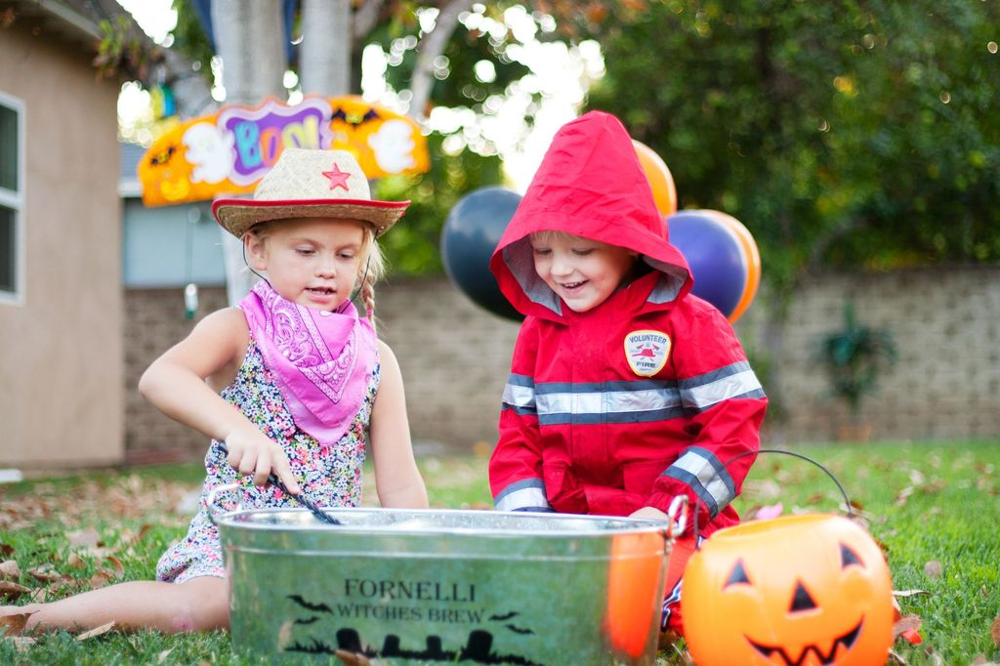

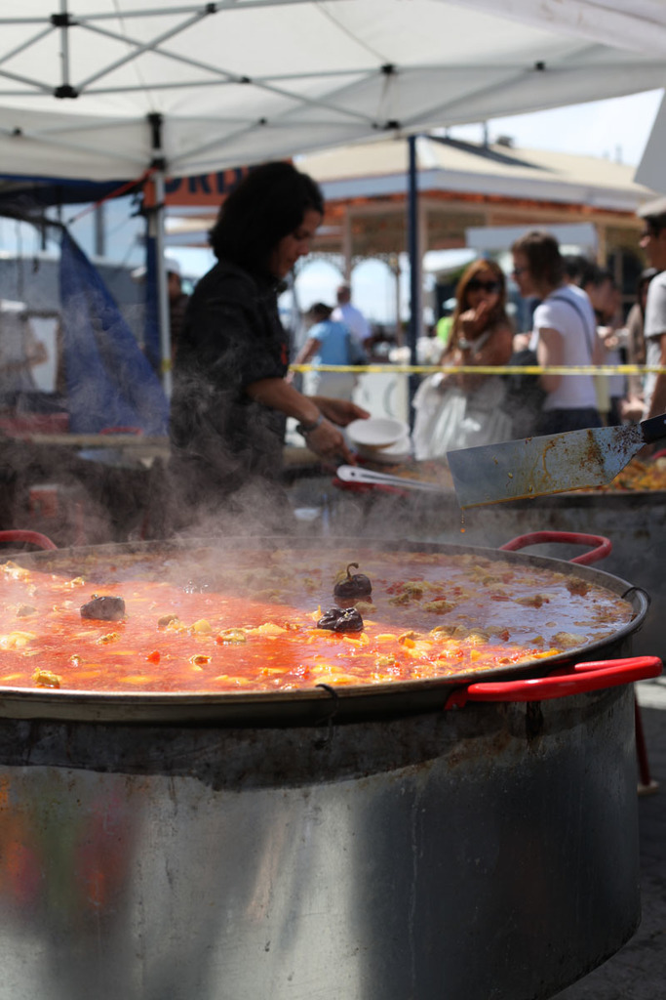

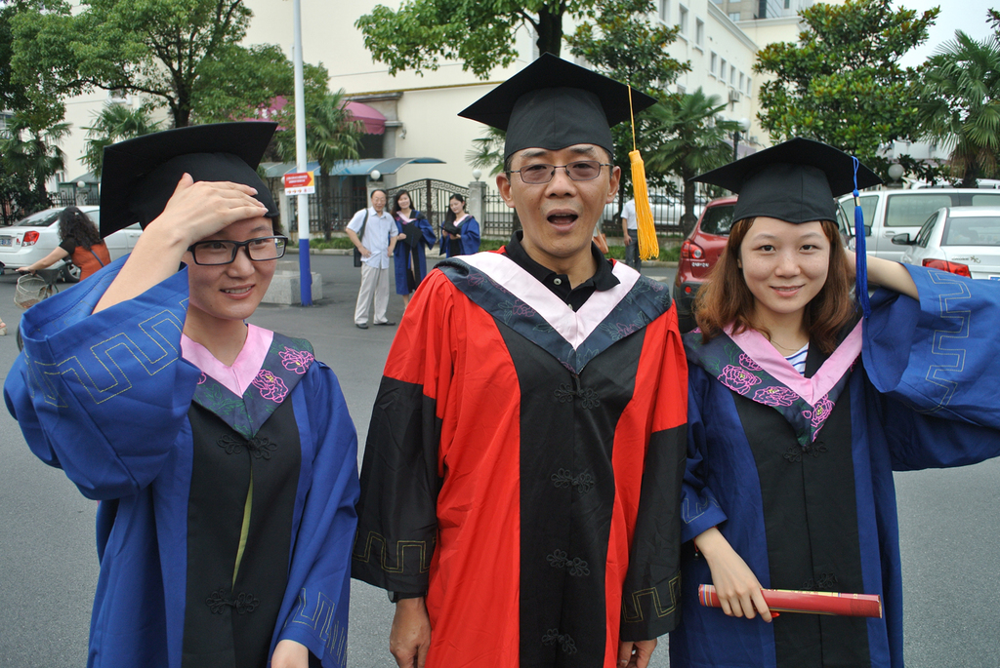

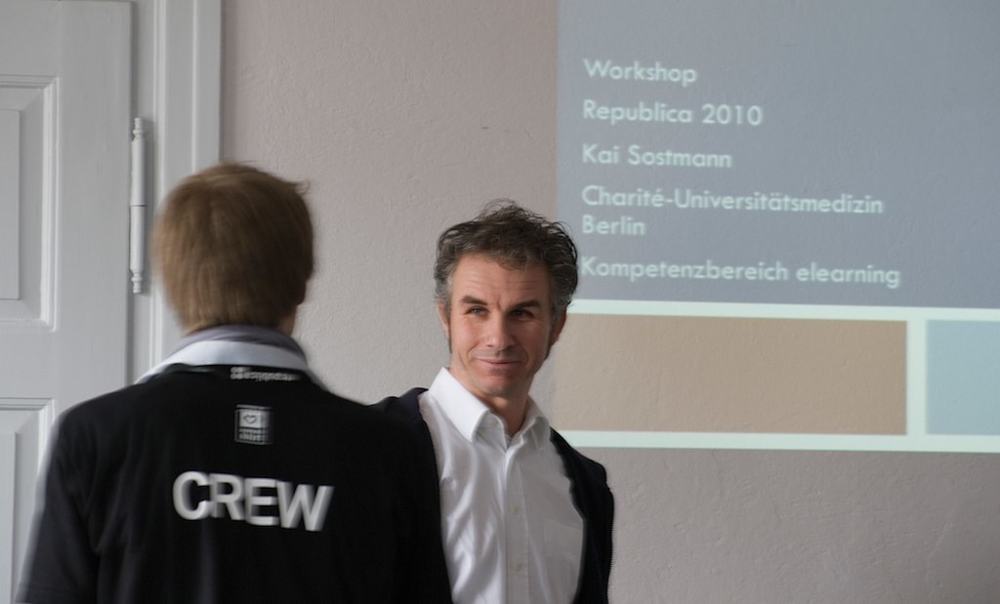

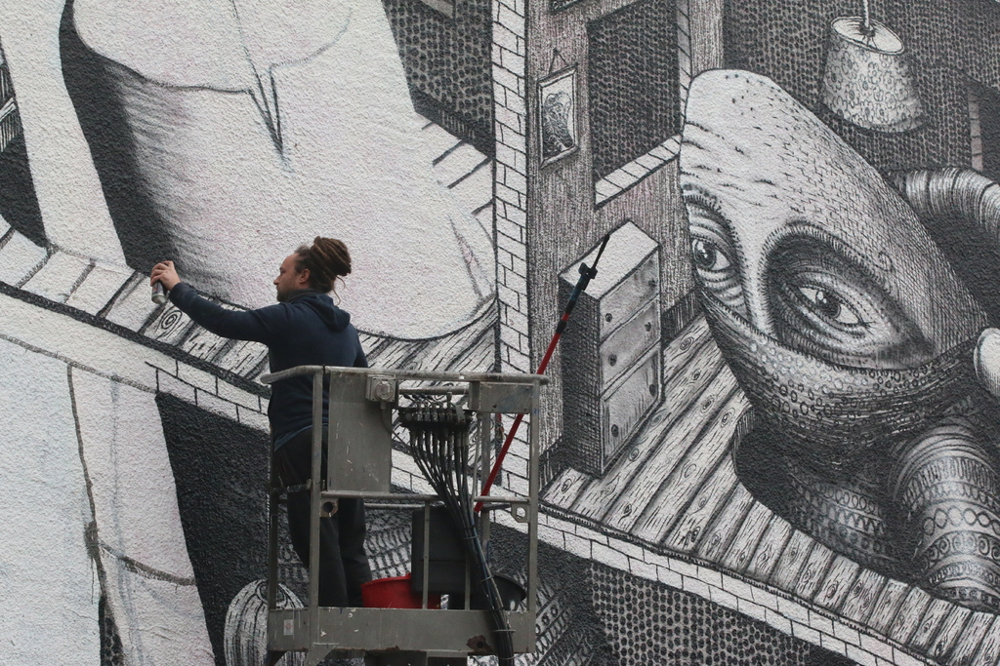

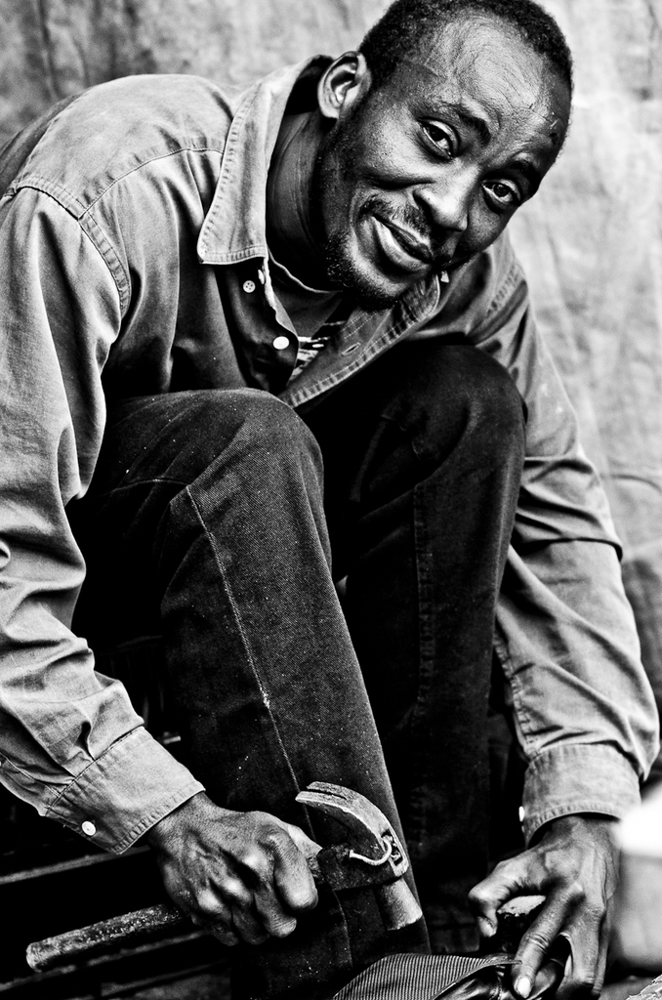

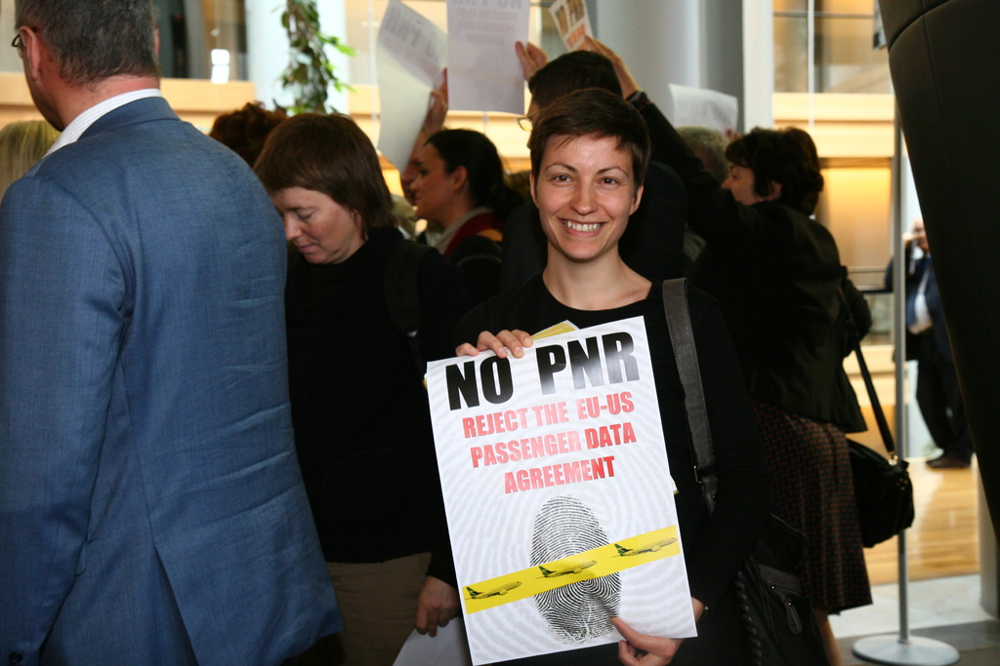

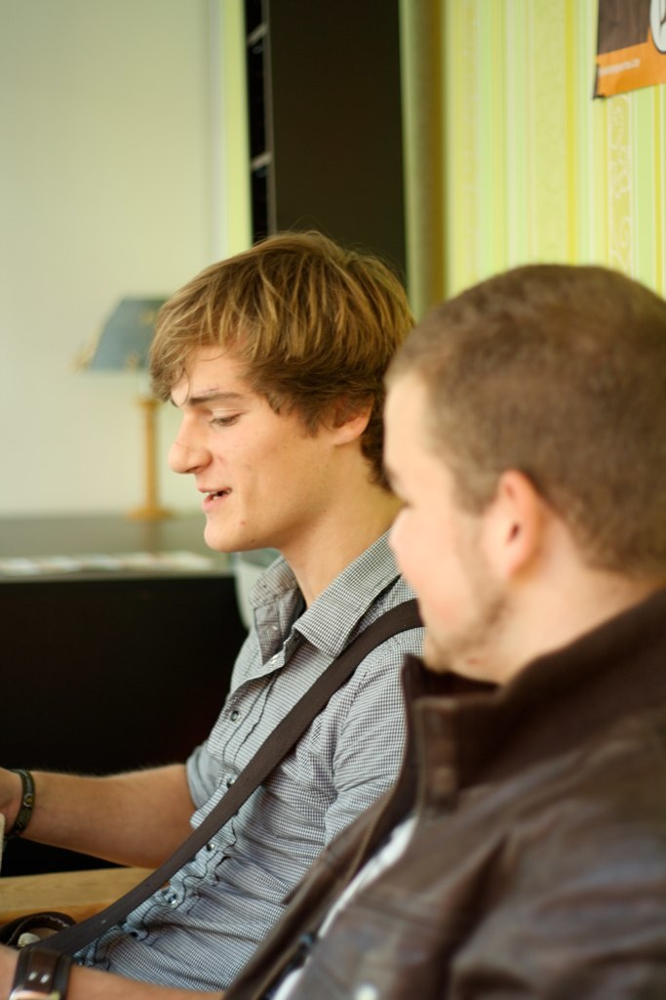

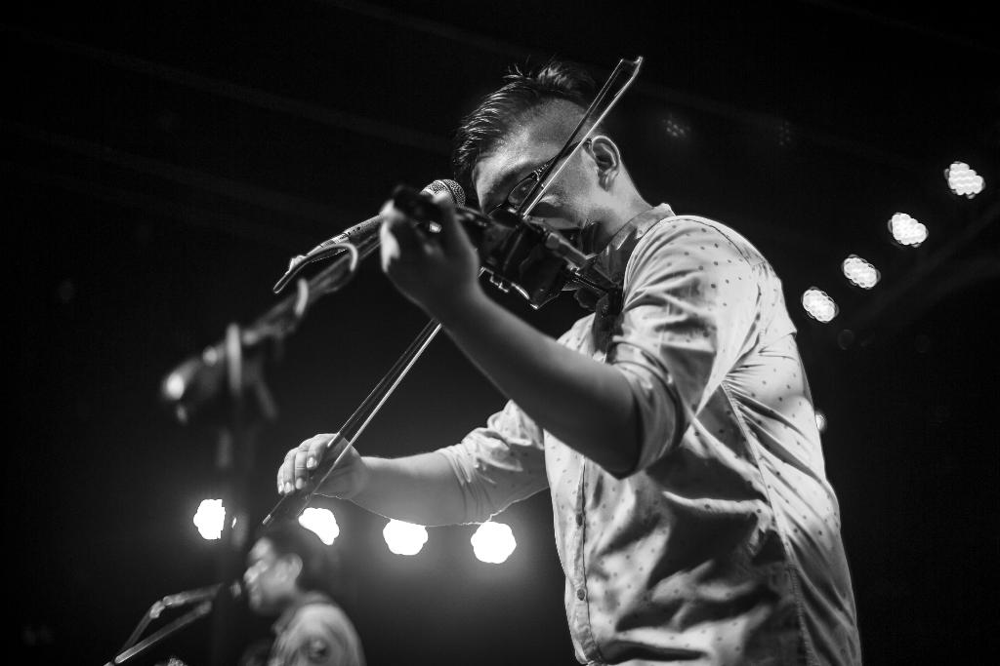

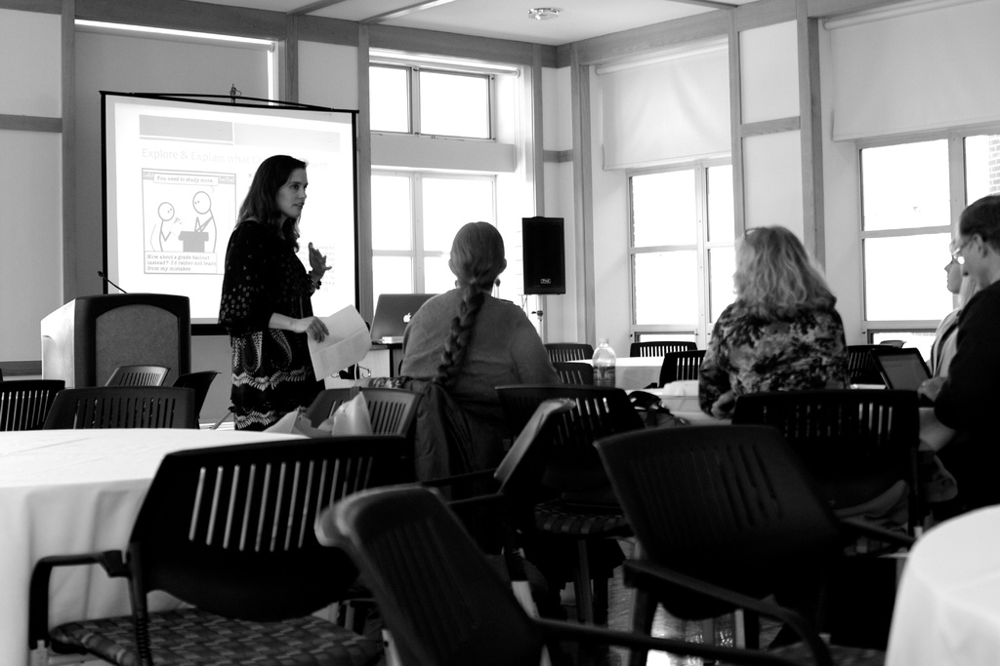

In [13]:
images_dir= "/kaggle/input/images/train"

for file in os.listdir(images_dir)[:10]:
    img= cv2.imread(os.path.join(images_dir, file))
    cv2_imshow(img)

# Visualize the data

# Create the yaml file

In [14]:

data = {
    "train": "/kaggle/input/images/train",
    "val": "/kaggle/input/images/val",
    "nc": 1,
    "names": ["face"]
}

with open("/kaggle/working/data.yaml", "w") as f:  # Open file in write mode
    yaml.dump(data, f, default_flow_style=False)  # Write data to YAML


In [15]:
import torch
print("CUDA available:", torch.cuda.is_available())


CUDA available: True


In [16]:
# Reading the YAML file
with open("/kaggle/working/data.yaml", "r") as f:
    loaded_data = yaml.safe_load(f)  # Load YAML as a Python dictionary

# Print the loaded data
print(loaded_data)

{'names': ['face'], 'nc': 1, 'train': '/kaggle/input/images/train', 'val': '/kaggle/input/images/val'}


In [17]:
!yolo task=detect mode=train model=yolov8n.pt data=/kaggle/working/data.yaml epochs=50 batch=16 imgsz=640 device=0 --verbose


WARNING ⚠️ argument '--verbose' does not require leading dashes '--', updating to 'verbose'.
Ultralytics 8.3.138 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=a

# Model training

## Plot train results

In [18]:
os.listdir("/kaggle/working/runs/detect/train")

['weights', 'args.yaml']

In [19]:
# read results csv
results_csv = pd.read_csv("/kaggle/working/runs/detect/train2/results.csv")
print(results_csv.to_string())

    epoch      time  train/box_loss  train/cls_loss  train/dfl_loss  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  metrics/mAP50-95(B)  val/box_loss  val/cls_loss  val/dfl_loss    lr/pg0    lr/pg1    lr/pg2
0       1   171.389         1.39304         1.53977         1.24372               0.84426            0.72250           0.80151              0.49777       1.29611       0.92902       1.11623  0.003329  0.003329  0.003329
1       2   334.374         1.29854         0.96813         1.12009               0.86092            0.69589           0.78392              0.48311       1.29745       0.87524       1.12721  0.006531  0.006531  0.006531
2       3   496.863         1.31677         0.92806         1.13860               0.86750            0.68958           0.77624              0.47847       1.33145       0.86502       1.15742  0.009600  0.009600  0.009600
3       4   657.774         1.33598         0.91582         1.15781               0.86764            0.70904           0

In [20]:
results_csv.columns

Index(['epoch', 'time', 'train/box_loss', 'train/cls_loss', 'train/dfl_loss',
       'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
       'metrics/mAP50-95(B)', 'val/box_loss', 'val/cls_loss', 'val/dfl_loss',
       'lr/pg0', 'lr/pg1', 'lr/pg2'],
      dtype='object')

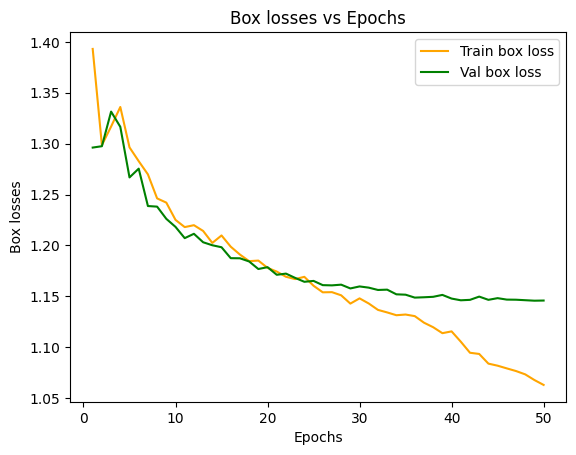

In [22]:
import matplotlib.pyplot as plt

epochs = len(results_csv["train/box_loss"])  # Automatically get number of rows
plt.plot(range(1, epochs + 1), results_csv["train/box_loss"], color="orange", label="Train box loss")
plt.plot(range(1, epochs + 1), results_csv["val/box_loss"], color="green", label="Val box loss")
plt.xlabel("Epochs")
plt.ylabel("Box losses")
plt.title("Box losses vs Epochs")
plt.legend()
plt.show()


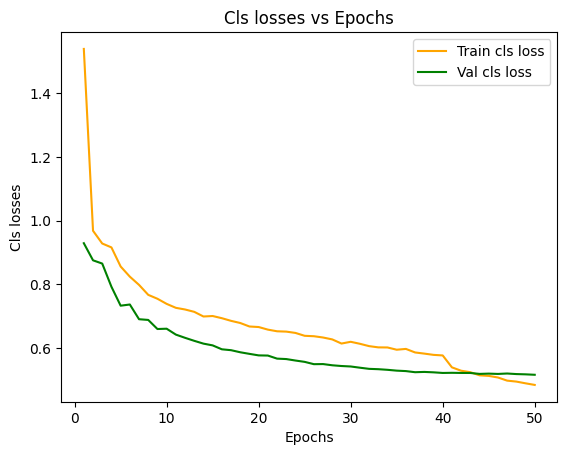

In [24]:
# plot cls loss
plt.plot(range(1, 51), results_csv["train/cls_loss"], color= "orange", label= "Train cls loss")
plt.plot(range(1, 51), results_csv["val/cls_loss"], color= "green", label= "Val cls loss")
plt.xlabel("Epochs")
plt.ylabel("Cls losses")
plt.title("Cls losses vs Epochs")
plt.legend();


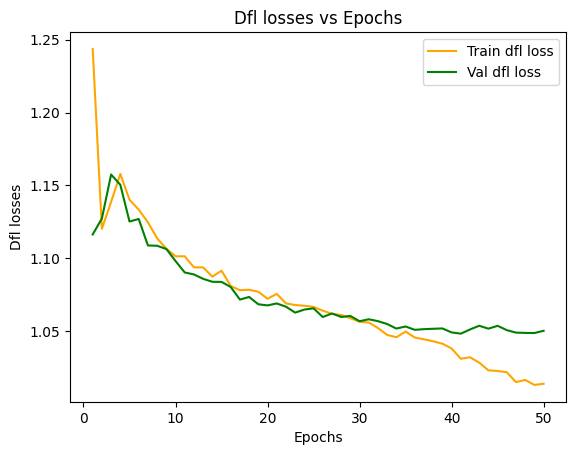

In [25]:
# plot dfl loss
plt.plot(range(1, 51), results_csv["train/dfl_loss"], color="orange", label="Train dfl loss")
plt.plot(range(1, 51), results_csv["val/dfl_loss"], color="green", label="Val dfl loss")
plt.xlabel("Epochs")
plt.ylabel("Dfl losses")
plt.title("Dfl losses vs Epochs")
plt.legend();


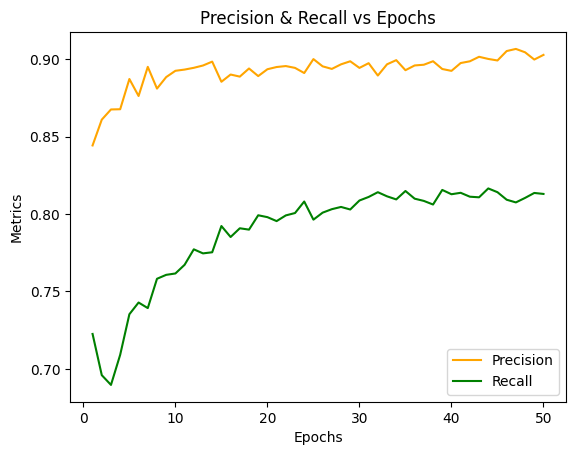

In [26]:
# plot precision and recall
plt.plot(range(1, 51), results_csv["metrics/precision(B)"], color="orange", label="Precision")
plt.plot(range(1, 51), results_csv["metrics/recall(B)"], color="green", label="Recall")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.title("Precision & Recall vs Epochs")
plt.legend();


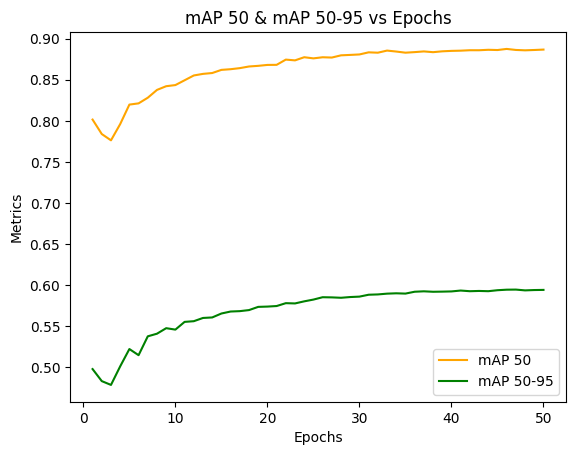

In [28]:
# plot mAP 50 and mAP 50-95
plt.plot(range(1, 51), results_csv["metrics/mAP50(B)"], color="orange", label="mAP 50")
plt.plot(range(1, 51), results_csv["metrics/mAP50-95(B)"], color="green", label="mAP 50-95")
plt.xlabel("Epochs")
plt.ylabel("Metrics")
plt.title("mAP 50 & mAP 50-95 vs Epochs")
plt.legend();


# Validation

In [30]:
os.listdir("/kaggle/working/runs/detect/train2/weights")

['best.pt', 'last.pt']

In [31]:
# cli
!yolo task= detect mode= val model= /kaggle/working/runs/detect/train2/weights/best.pt data= /kaggle/working/data.yaml

Ultralytics 8.3.138 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 555.1±294.0 MB/s, size: 301.0 KB)
val: Scanning /kaggle/input/labels/val... 3347 images, 0 backgrounds, 0 corrupt:
WARNING ⚠️ val: Cache directory /kaggle/input/labels is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  m
                   all       3347      10299      0.905      0.809      0.887      0.595
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
Speed: 0.2ms preprocess, 2.7ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at https://docs.ul

## Plot validation results

In [32]:
os.listdir("/kaggle/working/runs/detect/val")

['confusion_matrix_normalized.png',
 'F1_curve.png',
 'val_batch0_pred.jpg',
 'val_batch2_labels.jpg',
 'val_batch1_labels.jpg',
 'confusion_matrix.png',
 'R_curve.png',
 'P_curve.png',
 'val_batch0_labels.jpg',
 'val_batch2_pred.jpg',
 'PR_curve.png',
 'val_batch1_pred.jpg']

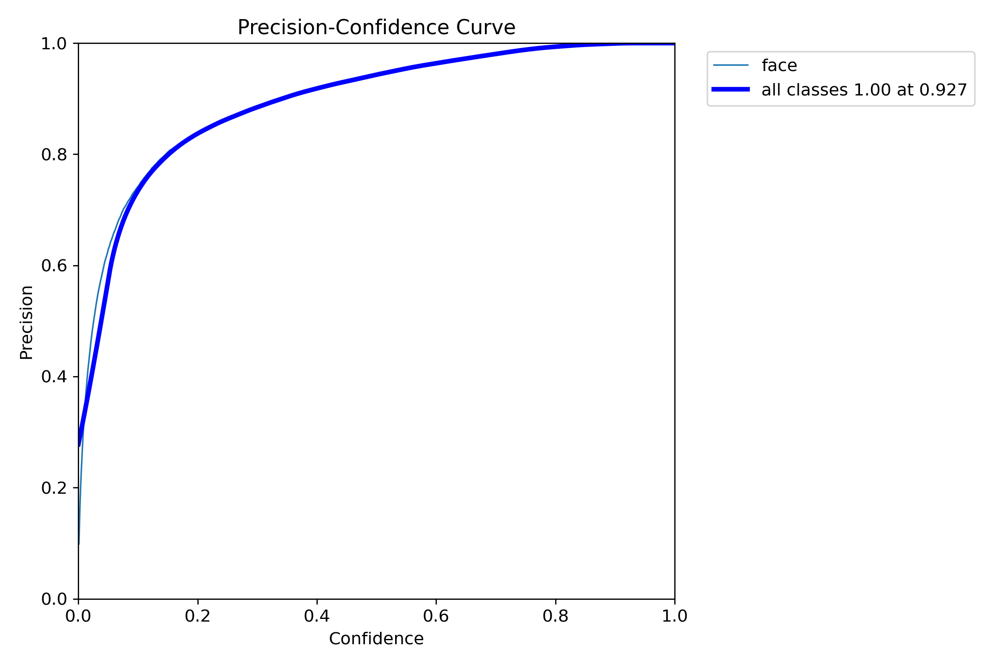

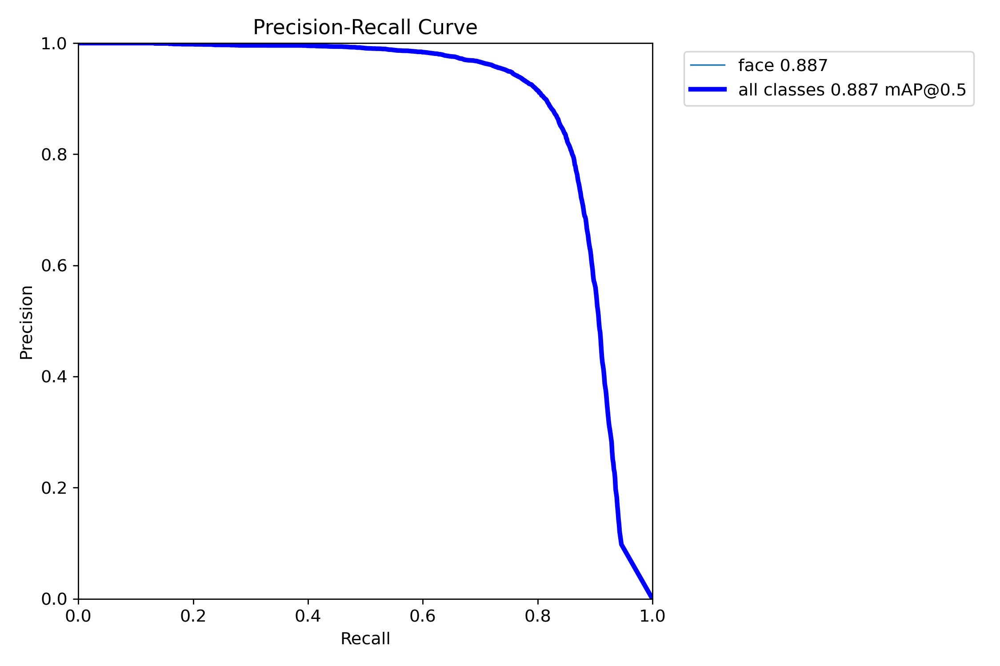

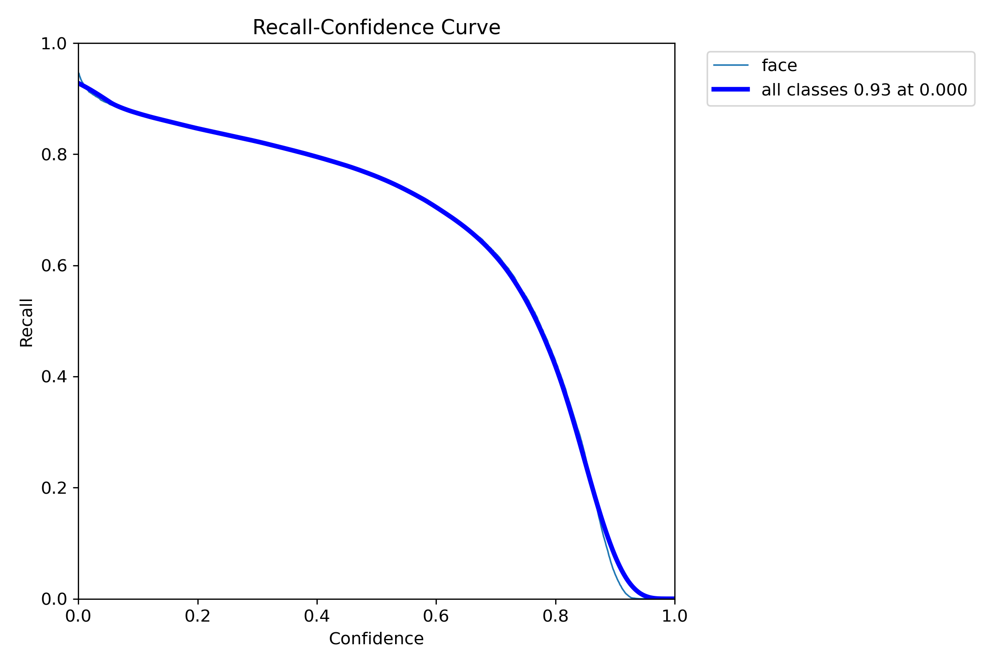

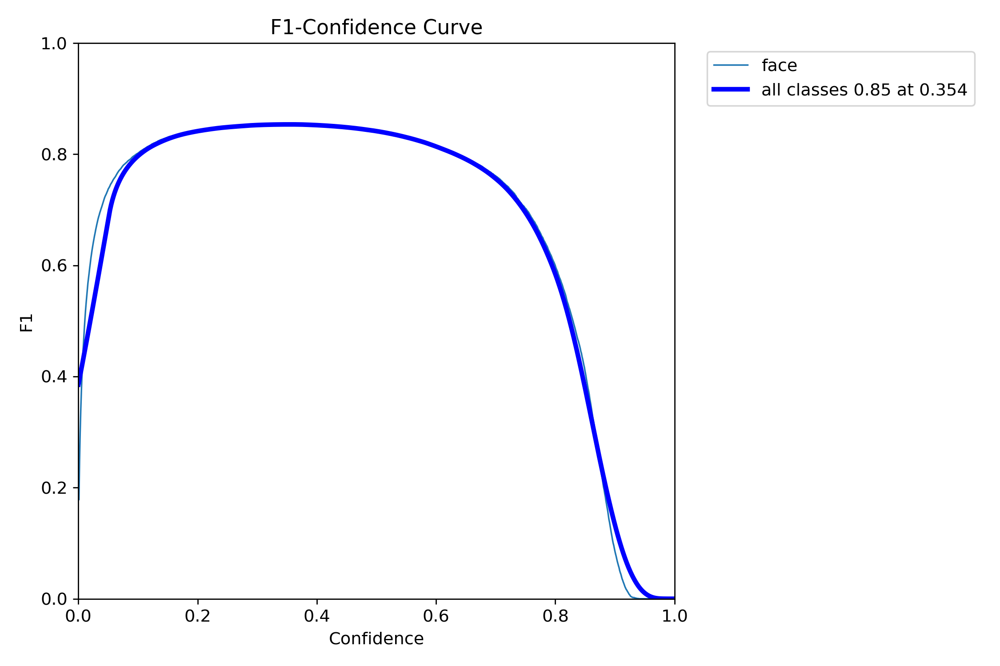

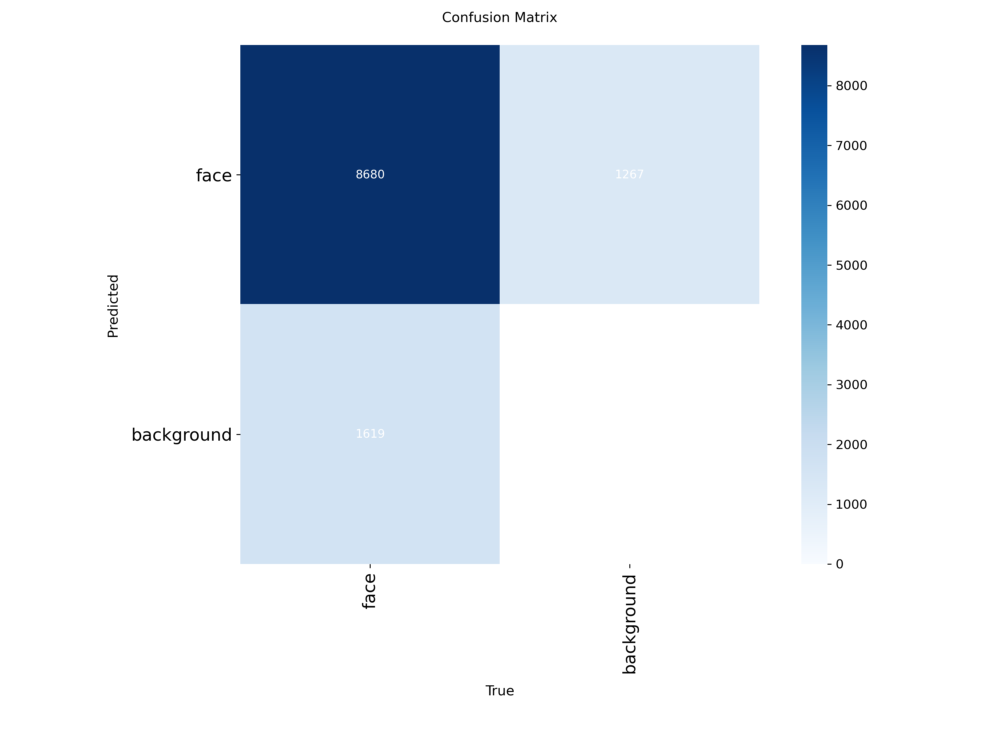

In [33]:
val_out_dir= "/kaggle/working/runs/detect/val"

# p curve, pr curve, r curve, f1 curve, confussion matrix
files= ['P_curve.png', 'PR_curve.png', 'R_curve.png', 'F1_curve.png', 'confusion_matrix.png']

for file in files:
    img= cv2.imread(os.path.join(val_out_dir, file))
    cv2_imshow(img)

In [39]:
import os

base_dir = '/kaggle/input'
for root, dirs, files in os.walk(base_dir):
    print(root)

/kaggle/input
/kaggle/input/labels2
/kaggle/input/labels
/kaggle/input/labels/val
/kaggle/input/labels/train
/kaggle/input/images
/kaggle/input/images/val
/kaggle/input/images/train


# Test evaluation

In [38]:
!yolo task= detect mode= predict conf= 0.25 source= /kaggle/input/labels/val model= /kaggle/working/runs/detect/train/weights/best.pt

Ultralytics 8.3.138 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs

Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 981, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 552, in predict
    return self.predictor.predict_cli(source=source) if is_cli else self.predictor(source=source, stream=stream)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/predictor.py", line 238, in predict_cli
    for _ in gen:  # sourcery skip: remove-empty-nested-block, noqa
  File "/usr/local/lib/python3.11/dist-packages/torch

In [40]:
# see the predicted images
test_res_dir= "/kaggle/working/runs/detect/predict"

for file in os.listdir(test_res_dir)[:10]:
    img= cv2.imread(os.path.join(test_res_dir, file))
    cv2_imshow(img)

FileNotFoundError: [Errno 2] No such file or directory: '/kaggle/working/runs/detect/predict'